In [6]:
import pandas  as pd 
import numpy as np 
import seaborn as sns 
from matplotlib import pyplot as plt 
! pip install pandas-profiling 
from pandas_profiling import ProfileReport
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error,r2_score,mean_absolute_error,mean_squared_error
from sklearn import metrics
from sklearn.svm import SVR
from sklearn.linear_model import Ridge,Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
import warnings 
warnings.filterwarnings('ignore')
%matplotlib inline

In [7]:
df=pd.read_csv("temperature_data.csv")
df

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
0,-0.752143,-1.118446,0.327935,-1.297858,-1.222428,-0.250182,1.029572,-0.245860,-2.522071,-1.831422,-2.066143,-2.018033,4
1,-0.771263,-1.117021,0.329665,-1.297686,-1.222429,-0.249133,1.029509,-0.245832,-2.522418,-1.830969,-2.064859,-2.017631,4
2,-0.782892,-1.116681,0.332771,-1.301822,-1.222428,-0.249431,1.029448,-0.245818,-2.522673,-1.830400,-2.064073,-2.017343,4
3,-0.780935,-1.116764,0.333700,-1.301852,-1.222430,-0.248636,1.032845,-0.246955,-2.521639,-1.830333,-2.063137,-2.017632,4
4,-0.774043,-1.116775,0.335206,-1.303118,-1.222429,-0.248701,1.031807,-0.246610,-2.521900,-1.830498,-2.062795,-2.018145,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
998065,-0.047497,0.341638,0.331475,-1.246114,-1.222428,-0.255640,1.029142,-0.245723,0.429853,1.018568,0.836084,0.494725,72
998066,-0.048839,0.320022,0.331701,-1.250655,-1.222437,-0.255640,1.029148,-0.245736,0.429751,1.013416,0.834438,0.494279,72
998067,-0.042350,0.307415,0.330946,-1.246852,-1.222430,-0.255640,1.029191,-0.245701,0.429439,1.002906,0.833936,0.492666,72
998068,-0.039433,0.302082,0.330987,-1.249505,-1.222432,-0.255640,1.029147,-0.245727,0.429558,0.999157,0.830504,0.490581,72


In [8]:
df.shape

(998070, 13)

In [9]:
df.describe()

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
count,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000
mean,-0.003905,0.004723,0.004780,-0.005690,-0.006336,-0.003333,0.006043,-0.003194,-0.004396,0.000609,-0.002208,-0.003935,50.732001
std,0.993127,1.002423,0.997878,1.002330,1.001229,0.997907,0.998994,0.997912,0.995686,1.001049,0.999597,0.998343,22.073125
min,-8.573954,-1.429349,-1.655373,-1.861463,-1.371529,-3.345953,-3.245874,-3.341639,-2.631991,-1.834688,-2.066143,-2.019973,4.000000
25%,-0.599385,-1.037925,-0.826359,-0.927390,-0.951892,-0.266917,-0.756296,-0.257269,-0.672308,-0.747265,-0.761951,-0.725622,32.000000
50%,0.266157,-0.177187,0.267542,-0.099818,-0.140246,-0.187246,0.213935,-0.190076,0.094367,-0.057226,0.005085,0.006536,56.000000
75%,0.686675,0.650709,0.358491,0.852625,0.853584,0.547171,1.013975,0.499260,0.680691,0.697344,0.772239,0.725660,68.000000
max,2.967117,2.649032,2.274734,1.793498,2.024164,3.016971,1.060937,2.914185,2.917456,2.449158,2.326668,2.653781,81.000000


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 998070 entries, 0 to 998069
Data columns (total 13 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   ambient         998070 non-null  float64
 1   coolant         998070 non-null  float64
 2   u_d             998070 non-null  float64
 3   u_q             998070 non-null  float64
 4   motor_speed     998070 non-null  float64
 5   torque          998070 non-null  float64
 6   i_d             998070 non-null  float64
 7   i_q             998070 non-null  float64
 8   pm              998070 non-null  float64
 9   stator_yoke     998070 non-null  float64
 10  stator_tooth    998070 non-null  float64
 11  stator_winding  998070 non-null  float64
 12  profile_id      998070 non-null  int64  
dtypes: float64(12), int64(1)
memory usage: 99.0 MB


In [11]:
profile = ProfileReport(df)
profile.to_file(output_file= " Discharge_profiling.html") ;

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [12]:
profile

In [13]:
# plt.figure(figsize = (15, 13))
# sns.boxplot(data = df[df.columns[:13]]); 
# sns.boxplot(data=df.columns[:-1]);
# sns.pairplot(df);

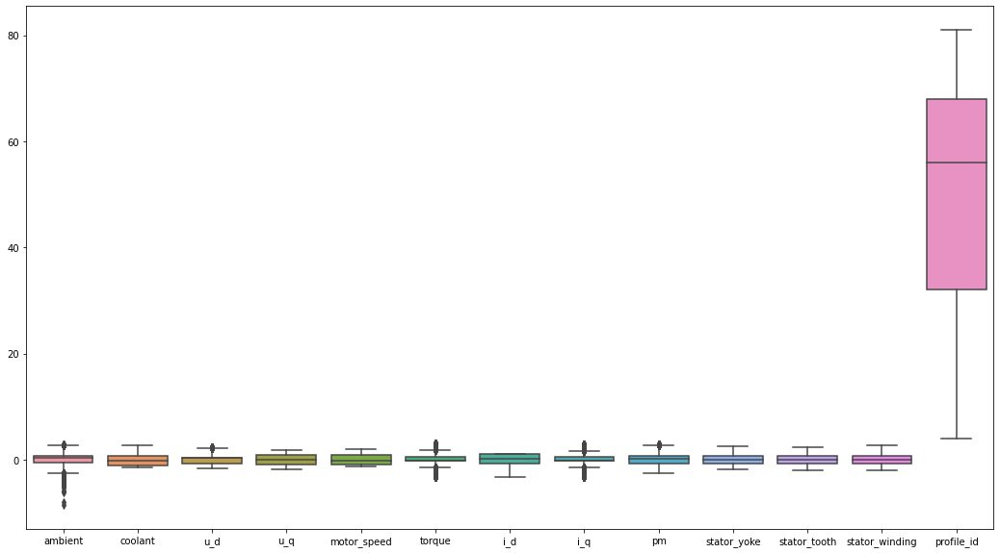

In [14]:
plt.figure(figsize = (18, 10)) 
sns.boxplot(data = df[df.columns[:13]]);   

ambient  :
Skew :  -0.8489138249162917  : 
Kurtosis :  0.822426565610952



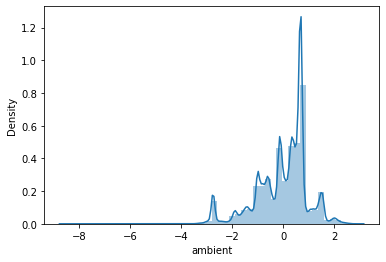

coolant  :
Skew :  0.6282471402211814  : 
Kurtosis :  -0.7599463836890359



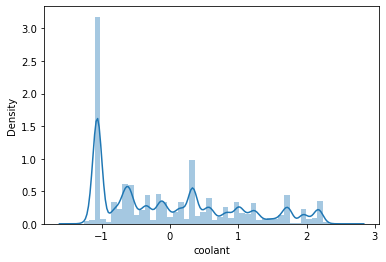

u_d  :
Skew :  0.19464403446801343  : 
Kurtosis :  -0.5228583948458345



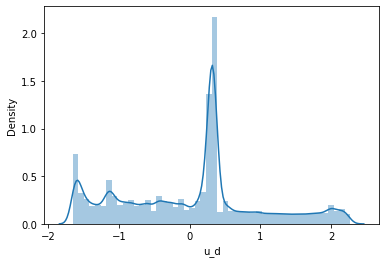

u_q  :
Skew :  0.19988508399235655  : 
Kurtosis :  -1.271315718489302



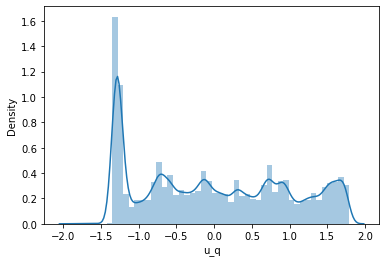

motor_speed  :
Skew :  0.3333048472645522  : 
Kurtosis :  -1.1669369999151742



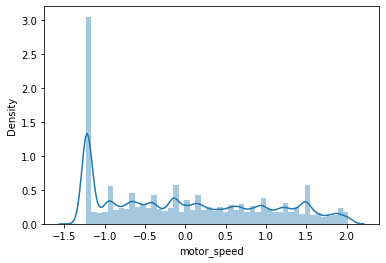

torque  :
Skew :  -0.042660488385365035  : 
Kurtosis :  0.7793178684855206



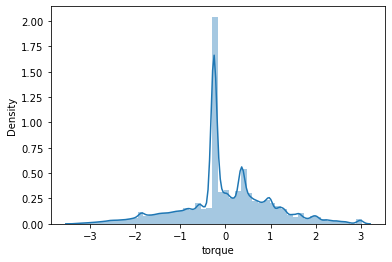

i_d  :
Skew :  -0.62257797275636  : 
Kurtosis :  -0.754099941976742



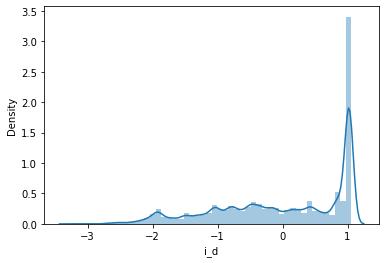

i_q  :
Skew :  -0.07570538427941409  : 
Kurtosis :  0.7849738434370379



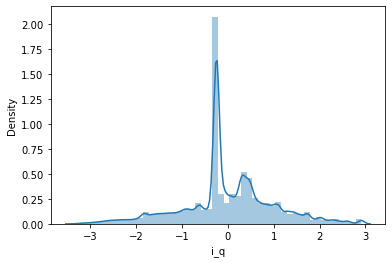

pm  :
Skew :  -0.2329033950928521  : 
Kurtosis :  -0.3492131725408121



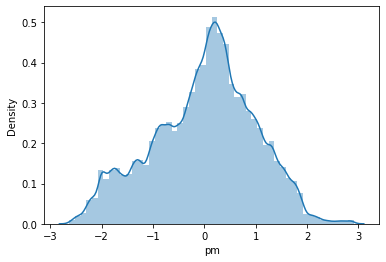

stator_yoke  :
Skew :  0.2572973686790802  : 
Kurtosis :  -0.7289625925727061



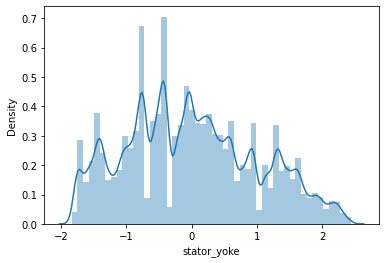

stator_tooth  :
Skew :  -0.0615332410896644  : 
Kurtosis :  -0.7799869810017213



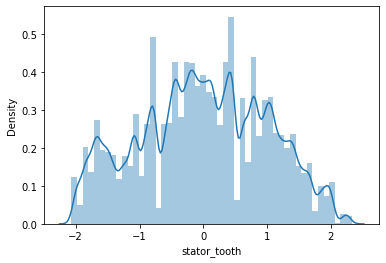

stator_winding  :
Skew :  -0.02805511318661168  : 
Kurtosis :  -0.7284159974661613



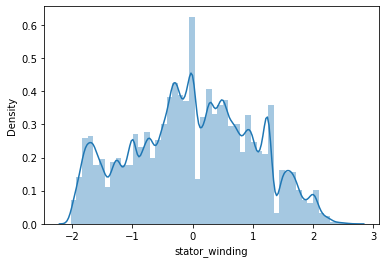

profile_id  :
Skew :  -0.6284123886037299  : 
Kurtosis :  -0.6526614359734477



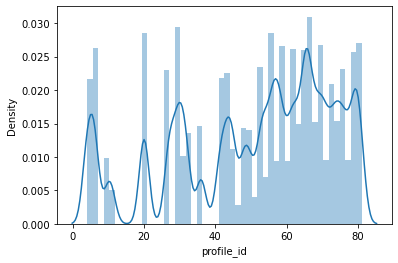

In [15]:
for i in df.columns:
    print(i,' :\nSkew : ',df[i].skew(),' : \nKurtosis : ',df[i].kurt())
    print()
    
    plt.figure()
    sns.distplot(df[i])
    plt.show()

#  finding outlier

In [16]:
Q1 = df.quantile(0.24)
Q3 = df.quantile(0.74)
IQR = Q3 - Q1
((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).sum()  

ambient            37496
coolant                0
u_d                 8658
u_q                    0
motor_speed            0
torque            121066
i_d                    0
i_q               131439
pm                  1679
stator_yoke            0
stator_tooth           0
stator_winding         0
profile_id             0
dtype: int64

#  Removing Outliers 

In [17]:
new_df = df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)]
new_df.shape

(829902, 13)

In [18]:
new_df

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
0,-0.752143,-1.118446,0.327935,-1.297858,-1.222428,-0.250182,1.029572,-0.245860,-2.522071,-1.831422,-2.066143,-2.018033,4
1,-0.771263,-1.117021,0.329665,-1.297686,-1.222429,-0.249133,1.029509,-0.245832,-2.522418,-1.830969,-2.064859,-2.017631,4
2,-0.782892,-1.116681,0.332771,-1.301822,-1.222428,-0.249431,1.029448,-0.245818,-2.522673,-1.830400,-2.064073,-2.017343,4
3,-0.780935,-1.116764,0.333700,-1.301852,-1.222430,-0.248636,1.032845,-0.246955,-2.521639,-1.830333,-2.063137,-2.017632,4
4,-0.774043,-1.116775,0.335206,-1.303118,-1.222429,-0.248701,1.031807,-0.246610,-2.521900,-1.830498,-2.062795,-2.018145,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
998065,-0.047497,0.341638,0.331475,-1.246114,-1.222428,-0.255640,1.029142,-0.245723,0.429853,1.018568,0.836084,0.494725,72
998066,-0.048839,0.320022,0.331701,-1.250655,-1.222437,-0.255640,1.029148,-0.245736,0.429751,1.013416,0.834438,0.494279,72
998067,-0.042350,0.307415,0.330946,-1.246852,-1.222430,-0.255640,1.029191,-0.245701,0.429439,1.002906,0.833936,0.492666,72
998068,-0.039433,0.302082,0.330987,-1.249505,-1.222432,-0.255640,1.029147,-0.245727,0.429558,0.999157,0.830504,0.490581,72


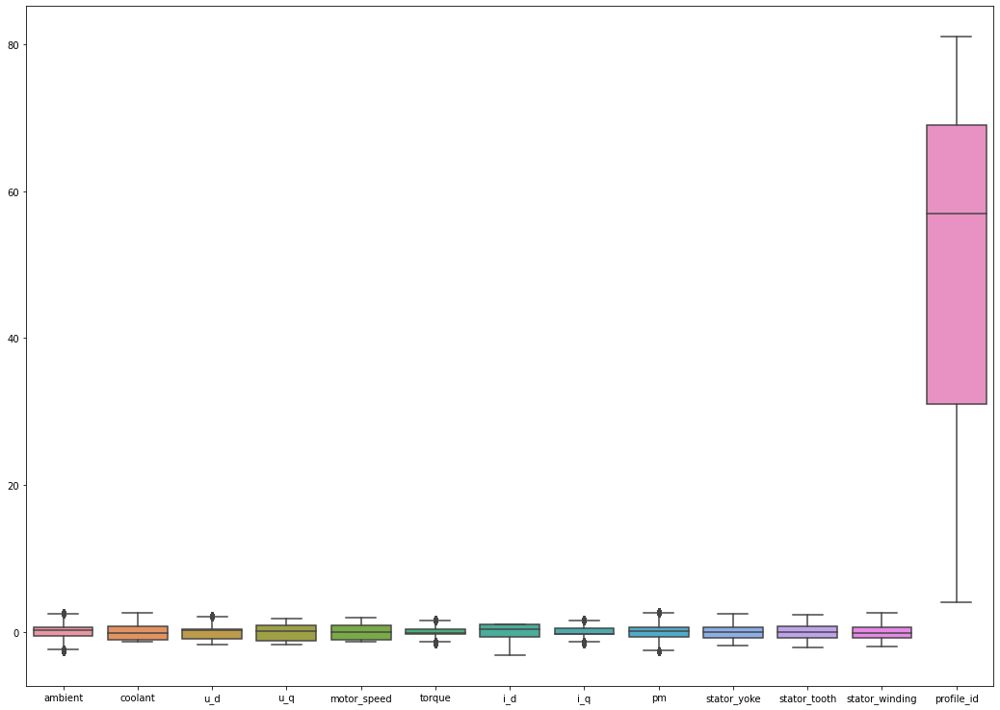

In [19]:
plt.figure(figsize = (18, 13)) 
sns.boxplot(data = new_df[new_df.columns[:13]]); 

In [20]:
new_df2=new_df.drop(['profile_id'],axis=1)
new_df2

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding
0,-0.752143,-1.118446,0.327935,-1.297858,-1.222428,-0.250182,1.029572,-0.245860,-2.522071,-1.831422,-2.066143,-2.018033
1,-0.771263,-1.117021,0.329665,-1.297686,-1.222429,-0.249133,1.029509,-0.245832,-2.522418,-1.830969,-2.064859,-2.017631
2,-0.782892,-1.116681,0.332771,-1.301822,-1.222428,-0.249431,1.029448,-0.245818,-2.522673,-1.830400,-2.064073,-2.017343
3,-0.780935,-1.116764,0.333700,-1.301852,-1.222430,-0.248636,1.032845,-0.246955,-2.521639,-1.830333,-2.063137,-2.017632
4,-0.774043,-1.116775,0.335206,-1.303118,-1.222429,-0.248701,1.031807,-0.246610,-2.521900,-1.830498,-2.062795,-2.018145
...,...,...,...,...,...,...,...,...,...,...,...,...
998065,-0.047497,0.341638,0.331475,-1.246114,-1.222428,-0.255640,1.029142,-0.245723,0.429853,1.018568,0.836084,0.494725
998066,-0.048839,0.320022,0.331701,-1.250655,-1.222437,-0.255640,1.029148,-0.245736,0.429751,1.013416,0.834438,0.494279
998067,-0.042350,0.307415,0.330946,-1.246852,-1.222430,-0.255640,1.029191,-0.245701,0.429439,1.002906,0.833936,0.492666
998068,-0.039433,0.302082,0.330987,-1.249505,-1.222432,-0.255640,1.029147,-0.245727,0.429558,0.999157,0.830504,0.490581


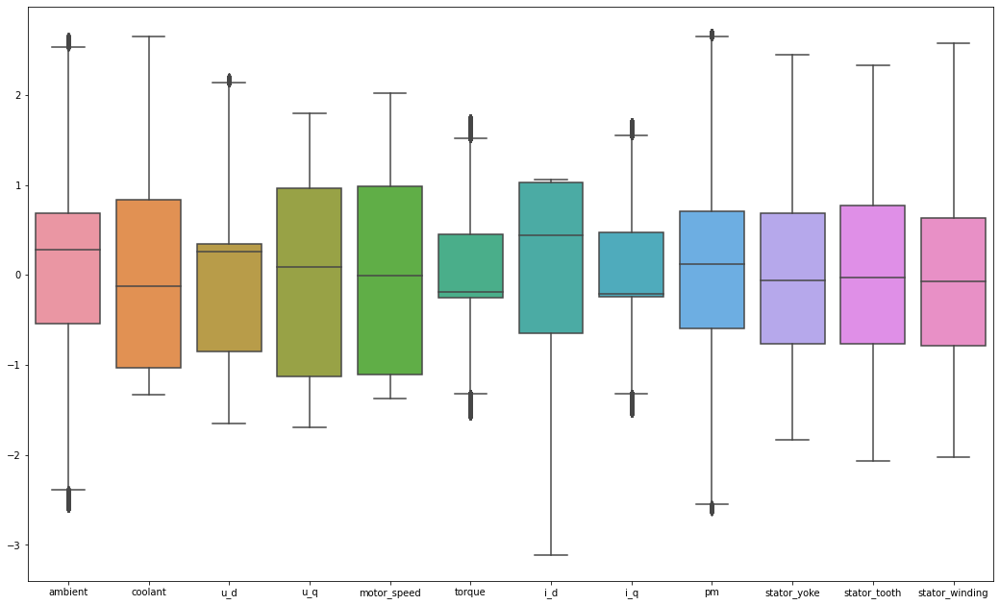

In [21]:
plt.figure(figsize = (18, 11)) 
sns.boxplot(data = new_df2[new_df2.columns]); 

In [22]:
corr= new_df2.corr()
corr

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding
ambient,1.000000,0.398770,0.156121,0.069632,0.034741,-0.168637,0.012987,-0.169968,0.398149,0.416085,0.365689,0.293535
coolant,0.398770,1.000000,0.179160,0.013515,-0.054972,-0.178527,0.108518,-0.173901,0.392064,0.883070,0.704050,0.540602
u_d,0.156121,0.179160,1.000000,-0.011228,-0.291288,-0.888485,0.505007,-0.848910,-0.160389,0.000429,-0.136560,-0.242012
u_q,0.069632,0.013515,-0.011228,1.000000,0.723630,-0.054010,-0.279920,-0.037679,0.091794,0.127997,0.197058,0.202687
motor_speed,0.034741,-0.054972,-0.291288,0.723630,1.000000,0.095694,-0.821134,0.061630,0.326231,0.194937,0.375438,0.472109
torque,-0.168637,-0.178527,-0.888485,-0.054010,0.095694,1.000000,-0.362692,0.993045,0.056313,-0.041732,0.061362,0.154855
i_d,0.012987,0.108518,0.505007,-0.279920,-0.821134,-0.362692,1.000000,-0.302029,-0.350682,-0.175415,-0.385741,-0.531574
i_q,-0.169968,-0.173901,-0.848910,-0.037679,0.061630,0.993045,-0.302029,1.000000,0.030433,-0.052773,0.038271,0.122637
pm,0.398149,0.392064,-0.160389,0.091794,0.326231,0.056313,-0.350682,0.030433,1.000000,0.681926,0.781996,0.783391
stator_yoke,0.416085,0.883070,0.000429,0.127997,0.194937,-0.041732,-0.175415,-0.052773,0.681926,1.000000,0.950579,0.856579


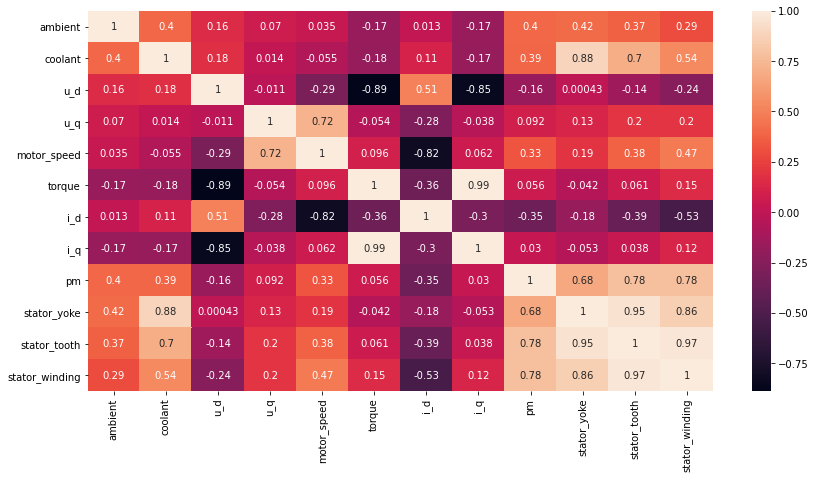

In [23]:
plt.figure(figsize=(14,7))
sns.heatmap(corr,annot=True);

#  Feature Extraction 

In [75]:
X=new_df2[['ambient','coolant','u_d','u_q','motor_speed','torque','i_d','i_q','stator_yoke']]
X.columns

Index(['ambient', 'coolant', 'u_d', 'u_q', 'motor_speed', 'torque', 'i_d',
       'i_q', 'stator_yoke'],
      dtype='object')

In [25]:
y=new_df2[['pm']]
y 

,pm
0,-2.522071
1,-2.522418
2,-2.522673
3,-2.521639
4,-2.521900
...,...
998065,0.429853
998066,0.429751
998067,0.429439
998068,0.429558


# Train Test Split

In [26]:
X_train,X_test,y_train,y_test = train_test_split(X,y,train_size=0.5, random_state= 0 )     

# Model Building 

# 1  Linear Regression 

In [27]:
lin_reg= LinearRegression()
lin_reg.fit(X_train,y_train)

LinearRegression()

# Model Evaluation 

In [28]:
pred= lin_reg.predict(X_test)
pred

array([[-0.03721963],
       [-0.94572295],
       [ 0.93267684],
       ...,
       [ 0.68338435],
       [ 0.17434994],
       [ 1.25344556]])

# Test Accuracy

In [29]:
print("Test Accuracy of Model",lin_reg.score(X_test,y_test))

Test Accuracy of Model 0.7267365838678195


# Train Accuracy

In [30]:
print("Train Accuracy of Model",lin_reg.score(X_train,y_train)) 

Train Accuracy of Model 0.7274335880319529


# mean squared error 

In [31]:
mse=mean_squared_error(y_test,pred)
print("Mean Squared Error",mse)

Mean Squared Error 0.2492431150976761


# Root mean squared error 

In [32]:
rmse= np.sqrt(mse)
print("Root mean Squared Error", rmse)

Root mean Squared Error 0.4992425413540758


# Accuracy Score

In [33]:
accu_score=lin_reg.score(X_test,y_test)
print("Accuracy Score",accu_score)

Accuracy Score 0.7267365838678195


# Decision Tree

In [34]:
dt= DecisionTreeRegressor(criterion='mse')
dt.fit(X_train,y_train) 

DecisionTreeRegressor()

In [36]:
# Conceptualized  Exploratory Data Analysis and its applicability in corporate world.
# Have Built a strong core in Machine Learning Algorithms and working on it.
# Have led the Team of five in a project on Electric Motor Temperature Prediction

In [37]:
pred_dt=dt.predict(X_test)
pred_dt

array([ 0.40882128, -0.88211477,  1.3362191 , ...,  0.39521635,
       -0.3240311 ,  0.9591783 ])

# Accuracy Score Decision Tree

In [68]:
dt_score=dt.score(X_test,y_test) 
print("Decision Tree Accuracy Score",dt_score)

Decision Tree Accuracy Score 0.9935659856069109


# Test Accuracy Decision Tree

In [39]:
print("Test Accuracy of Model",dt.score(X_test,y_test))

Test Accuracy of Model 0.9935659856069109


# Train Accuracy  Decision Tree

In [40]:
print("Train Accuracy of Model",dt.score(X_train,y_train)) 

Train Accuracy of Model 1.0


# Root Mean Squared Error Decision Tree

In [45]:
dtrmse = np.sqrt(dtmse)
print("Root mean Squared Error", dtrmse)

Root mean Squared Error 0.07660583534568742


# Mean Squared Error Decision Tree

In [44]:
dtmse=mean_squared_error(y_test,pred_dt)
print("Mean Squared Error",dtmse)

Mean Squared Error 0.005868454009010573


# Random Forest 


In [46]:
regressor = RandomForestRegressor(n_estimators=80, criterion='mse')
regressor.fit(X_train,y_train) 

RandomForestRegressor(n_estimators=80)

In [47]:
ypre = regressor.predict(X_test)

# Accuracy Score Random Forest 

In [48]:
regressor.score(X_test,y_test) 

0.9973001390067957

In [62]:
X_test

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,stator_yoke
989879,-0.159279,-0.551018,0.305111,-1.275500,-1.217576,-0.281510,1.012160,-0.272315,-0.532614
365295,-0.155082,-0.611835,0.339970,-1.254967,-1.222429,-0.255640,1.029143,-0.245715,-1.201853
224098,-1.666036,-1.041916,-1.599793,-0.618323,1.347762,0.687554,-1.911321,0.560823,-0.016361
820847,-0.093394,0.820509,0.340703,0.592875,-0.268344,-0.301985,1.009863,-0.298775,0.893140
113063,-0.394310,-1.069584,-1.138657,0.674753,1.888852,0.288670,-1.311516,0.232577,-0.935408
...,...,...,...,...,...,...,...,...,...
310089,0.402570,0.327573,-0.607911,1.322682,0.130298,0.371283,0.822137,0.484264,0.287523
491475,1.544324,1.012874,1.310026,0.213722,-0.275618,-1.389768,0.523868,-1.510765,0.873113
897341,0.602668,1.727881,-0.261891,1.611177,0.934567,-0.011906,0.011707,0.002960,1.570659
426608,0.682376,-1.085115,0.840162,1.517281,1.870295,-0.528312,-0.790462,-0.506244,-0.792463


In [65]:
regressor.predict([['-0.159279','0.551018','0.305111','-1.275500','-1.217576','-0.281510','1.012160','-0.272315','-0.532614']])

array([-0.74047961])

In [66]:
y_test

,pm
989879,0.412204
365295,-0.871467
224098,1.347518
820847,0.596692
113063,-0.656188
...,...
310089,0.374723
491475,1.122872
897341,0.413319
426608,-0.504912


# Accuracy Score  Train 

In [49]:
regressor.score(X_train,y_train)

0.9996039875310982

# Accuracy Score 

In [50]:
regressor.score(X_test,y_test) 

0.9973001390067957

# Mean Squared Error Decision Tree

In [51]:
rfmse=mean_squared_error(y_test,ypre)
print("root mean square error",rfmse)

root mean square error 0.0024625387979173626


# Root Mean Squared Error Decision Tree

In [52]:
rfrmse= np.sqrt(rfmse)
print("Root mean Squared Error", rfrmse)

Root mean Squared Error 0.049623974023826053


# XGboost 

In [53]:
from xgboost import XGBRegressor

In [54]:
xgbr= XGBRegressor(verbosity=0)
xgbr

XGBRegressor(base_score=None, booster=None, colsample_bylevel=None,
             colsample_bynode=None, colsample_bytree=None,
             enable_categorical=False, gamma=None, gpu_id=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_delta_step=None, max_depth=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, reg_alpha=None, reg_lambda=None,
             scale_pos_weight=None, subsample=None, tree_method=None,
             validate_parameters=None, verbosity=0)

In [55]:
xgbr.fit(X_train,y_train)
xgscore= xgbr.score(X_train,y_train)

In [56]:
print("Training Score XGBOOST",xgscore)

Training Score XGBOOST 0.9672948911793756


In [57]:
from sklearn.model_selection import cross_val_score

In [58]:
cv_score= cross_val_score(xgbr,X_train,y_train,cv=10)
print ('CV Mean Score',cv_score.mean())

CV Mean Score 0.9655914819919289


In [69]:
predxg= xgbr.predict(X_test)
xgmse=mean_squared_error(y_test,predxg)
xgrmse= np.sqrt(xgmse)
print("mean Square Error",xgmse)
print("root mean square error",xgrmse) 

mean Square Error 0.0314725221072734
root mean square error 0.17740496641095874


In [67]:
import pickle

In [70]:
file_name= "temp_prediction.sav"
pickle.dump(regressor,open(file_name,'wb'))

# loading the save model

In [74]:
load_model = pickle.load(open('temp_prediction.sav','rb'))